# Name : Piyush Sharma
# Organisation : The Sparks Foundation
# Task 3 : Exploratory Data Analysis - Retail

## Importing libraries

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

## Reading the data from the file

In [2]:
data = pd.read_csv('SampleSuperstore.csv')
data.head(10)

,Ship Mode,Segment,Country,City,State,Postal Code,Region,Category,Sub-Category,Sales,Quantity,Discount,Profit
0,Second Class,Consumer,United States,Henderson,Kentucky,42420,South,Furniture,Bookcases,261.9600,2,0.00,41.9136
1,Second Class,Consumer,United States,Henderson,Kentucky,42420,South,Furniture,Chairs,731.9400,3,0.00,219.5820
2,Second Class,Corporate,United States,Los Angeles,California,90036,West,Office Supplies,Labels,14.6200,2,0.00,6.8714
3,Standard Class,Consumer,United States,Fort Lauderdale,Florida,33311,South,Furniture,Tables,957.5775,5,0.45,-383.0310
4,Standard Class,Consumer,United States,Fort Lauderdale,Florida,33311,South,Office Supplies,Storage,22.3680,2,0.20,2.5164
5,Standard Class,Consumer,United States,Los Angeles,California,90032,West,Furniture,Furnishings,48.8600,7,0.00,14.1694
6,Standard Class,Consumer,United States,Los Angeles,California,90032,West,Office Supplies,Art,7.2800,4,0.00,1.9656
7,Standard Class,Consumer,United States,Los Angeles,California,90032,West,Technology,Phones,907.1520,6,0.20,90.7152
8,Standard Class,Consumer,United States,Los Angeles,California,90032,West,Office Supplies,Binders,18.5040,3,0.20,5.7825
9,Standard Class,Consumer,United States,Los Angeles,California,90032,West,Office Supplies,Appliances,114.9000,5,0.00,34.4700


In [200]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9994 entries, 0 to 9993
Data columns (total 13 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   Ship Mode     9994 non-null   object 
 1   Segment       9994 non-null   object 
 2   Country       9994 non-null   object 
 3   City          9994 non-null   object 
 4   State         9994 non-null   object 
 5   Postal Code   9994 non-null   int64  
 6   Region        9994 non-null   object 
 7   Category      9994 non-null   object 
 8   Sub-Category  9994 non-null   object 
 9   Sales         9994 non-null   float64
 10  Quantity      9994 non-null   int64  
 11  Discount      9994 non-null   float64
 12  Profit        9994 non-null   float64
dtypes: float64(3), int64(2), object(8)
memory usage: 1015.1+ KB


## Analysing the data

Office Supplies    6026
Furniture          2121
Technology         1847
Name: Category, dtype: int64

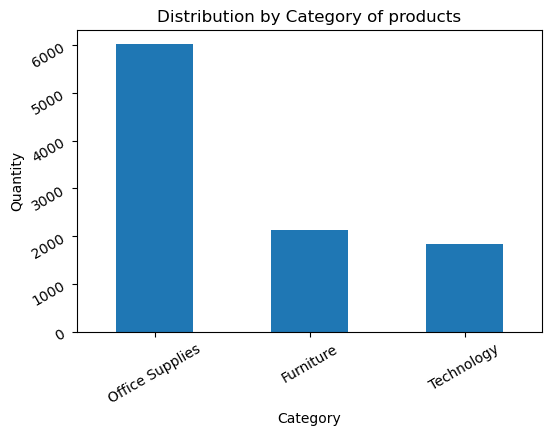

In [221]:
plt.figure(dpi=100)
data.Category.value_counts().plot(kind='bar')
plt.title('Distribution by Category of products')
plt.xlabel('Category')
plt.ylabel('Quantity')
plt.xticks(rotation=30)
plt.yticks(rotation=30)
data.Category.value_counts()

(array([   0.,  200.,  400.,  600.,  800., 1000., 1200., 1400., 1600.]),
 <a list of 9 Text major ticklabel objects>)

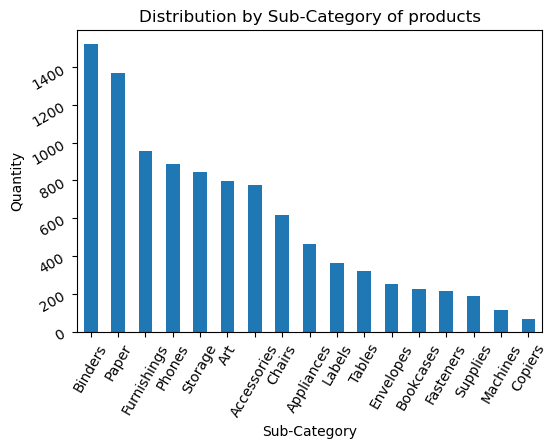

In [223]:
plt.figure(dpi=100)
data['Sub-Category'].value_counts().plot(kind='bar')
plt.title('Distribution by Sub-Category of products')
plt.xlabel('Sub-Category')
plt.ylabel('Quantity')
plt.xticks(rotation=60)
plt.yticks(rotation=30)

(array([   0., 1000., 2000., 3000., 4000., 5000., 6000.]),
 <a list of 7 Text major ticklabel objects>)

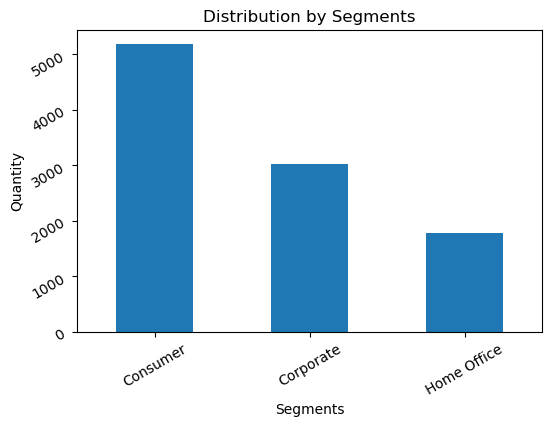

In [217]:
plt.figure(dpi=100)
data['Segment'].value_counts().plot(kind='bar')
plt.title('Distribution by Segments')
plt.xlabel('Segments')
plt.ylabel('Quantity')
plt.xticks(rotation=30)
plt.yticks(rotation=30)

## Total sales Vs regions of USA

(array([     0., 100000., 200000., 300000., 400000., 500000., 600000.,
        700000., 800000.]),
 <a list of 9 Text major ticklabel objects>)

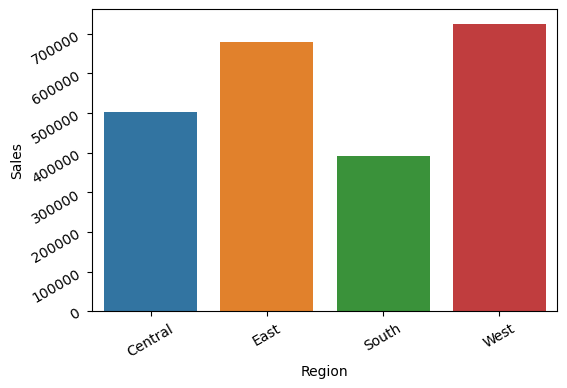

In [214]:
r=data.groupby('Region').agg({'Sales':lambda i:i.sum(),'Quantity':lambda j:j.sum(),'Profit':lambda k:k.sum()})
plt.figure(dpi=100)
sns.barplot(r.index,r.Sales)
plt.xticks(rotation=30)
plt.yticks(rotation=30)

## Total Quantity Vs regions of USA

(array([    0.,  2000.,  4000.,  6000.,  8000., 10000., 12000., 14000.]),
 <a list of 8 Text major ticklabel objects>)

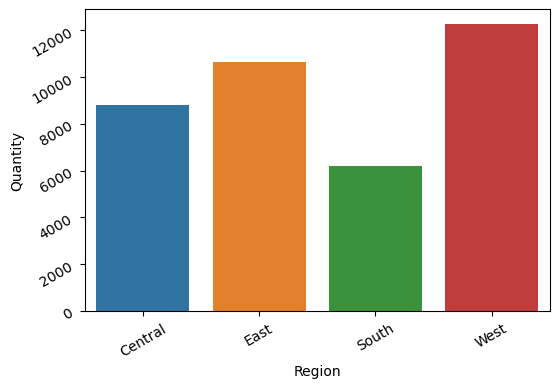

In [216]:
plt.figure(dpi=100)
sns.barplot(r.index,r.Quantity)
plt.xticks(rotation=30)
plt.yticks(rotation=30)

## Total profit Vs regions of USA

(array([     0.,  20000.,  40000.,  60000.,  80000., 100000., 120000.]),
 <a list of 7 Text major ticklabel objects>)

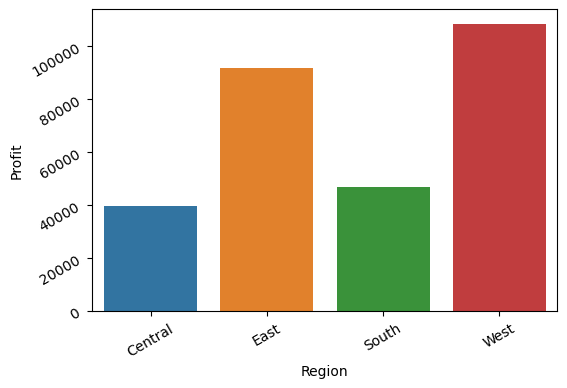

In [215]:
plt.figure(dpi=100)
sns.barplot(r.index,r.Profit)
plt.xticks(rotation=30)
plt.yticks(rotation=30)

## Distribution of Retails as per States in the USA

C:\Users\Lenovo\anaconda3\lib\site-packages\seaborn\distributions.py:283: UserWarning: Data must have variance to compute a kernel density estimate.
  warnings.warn(msg, UserWarning)
C:\Users\Lenovo\anaconda3\lib\site-packages\seaborn\distributions.py:283: UserWarning: Data must have variance to compute a kernel density estimate.
  warnings.warn(msg, UserWarning)
C:\Users\Lenovo\anaconda3\lib\site-packages\seaborn\distributions.py:283: UserWarning: Data must have variance to compute a kernel density estimate.
  warnings.warn(msg, UserWarning)


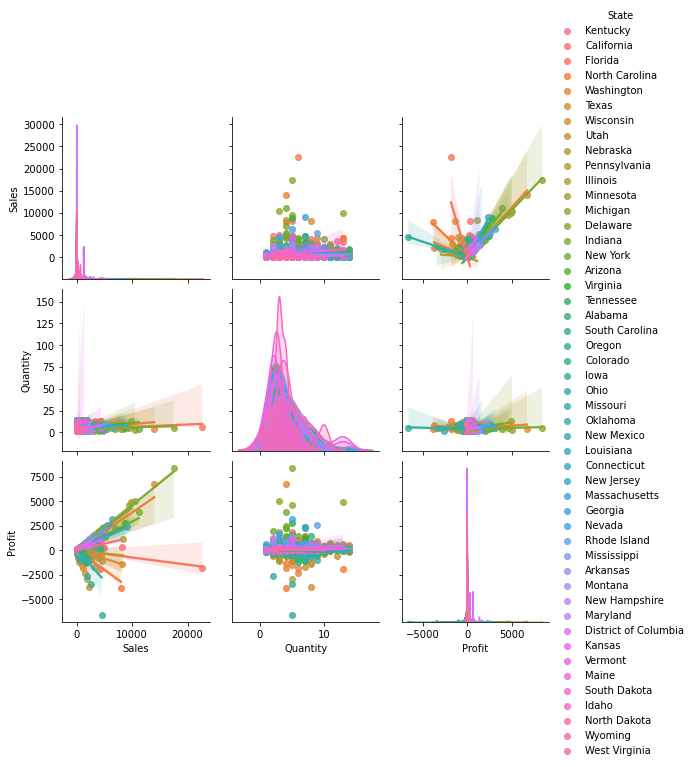

In [182]:
sns.pairplot(data,vars=['Sales','Quantity','Profit'],hue='State',kind='reg')

## Total Sales and Profit of Retail in USA

In [129]:
print('Total Sales income in USA ',data['Sales'].sum(),'USD dollars')
print('Total Profit income in USA ',data['Profit'].sum(),'USD dollars')

Total Sales income in USA  2297200.8603 USD dollars
Total Profit income in USA  286397.0217 USD dollars


## Top 10 Sales based States with their Profit

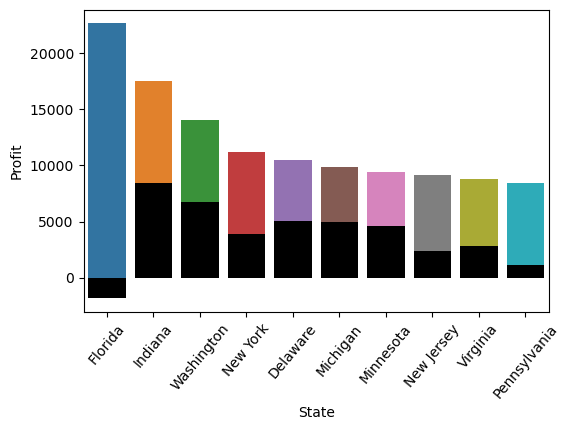

In [190]:
# Top 10 States with highest Sales.
# Black color barplots are the respective profit of that state.

plt.figure(dpi=100)
x= data.iloc[data['Sales'].sort_values(ascending=False).index].head(10)
sns.barplot(x.State,x.Sales)
plt.xticks(rotation=50)


sns.barplot(x.State,x.Profit,color='k')


## Top 10 Profit making States

(array([0, 1, 2, 3, 4, 5, 6, 7, 8]),
 <a list of 9 Text major ticklabel objects>)

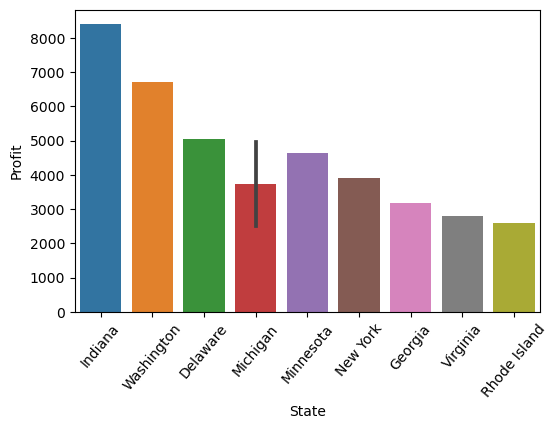

In [147]:
plt.figure(dpi=100)
y= data.iloc[data['Profit'].sort_values(ascending=False).index][['State','Profit']].head(10)
sns.barplot(y.State,y.Profit)
plt.xticks(rotation=50)

In [150]:
pd.set_option('display.max_columns',None)
pd.set_option('display.max_rows',None)

# Grouping the data

In [193]:
dt=data.groupby(['Segment','City','Postal Code','Region','Category','Sub-Category']).agg({'Sales': lambda i: i.sum(),'Quantity':lambda q:q.sum(),'Profit':lambda j:j.sum()})
dt

Sales  \
Segment     City              Postal Code Region  Category        Sub-Category               
Consumer    Aberdeen          57401       Central Office Supplies Supplies         25.5000   
            Abilene           79605       Central Office Supplies Appliances        1.3920   
            Akron             44312       East    Furniture       Furnishings     149.2320   
                                                  Office Supplies Art              22.6080   
                                                                  Binders          47.1660   
                                                                  Paper            49.2000   
                                                                  Storage         221.0240   
                                                  Technology      Accessories      71.9760   
                                                                  Phones          323.9820   
            Albuquerque       87105       West    Office Supplies Paper             4.2800   
                                                                  Storage         151.5400   
                                                  Technology      Phones           23.9760   
            Alexandria        22304       South   Office Supplies Fasteners        25.0600   
                                                                  Storage         105.7600   
            Allen             75002       Central Furniture       Tables          244.0060   
                                                  Office Supplies Binders           8.7840   
                                                                  Paper            15.9360   
                                                  Technology      Accessories      21.4800   
            Allentown         18103       East    Furniture       Furnishings      11.6480   
                                                  Office Supplies Art               4.1600   
            Amarillo          79109       Central Furniture       Chairs         2820.1740   
                                                                  Furnishings      23.0760   
                                                  Office Supplies Paper            54.2720   
                                                  Technology      Accessories     343.3920   
                                                                  Phones          307.1680   
            Anaheim           92804       West    Furniture       Chairs          363.9200   
                                                                  Tables          892.1360   
                                                  Office Supplies Appliances       83.4200   
                                                                  Art              26.6800   
                                                                  Binders         545.1680   
                                                                  Paper            30.9800   
                                                                  Storage        1049.0400   
                                                                  Supplies         51.1500   
                                                  Technology      Accessories     119.9600   
                                                                  Phones          302.3760   
            Andover           1810        East    Furniture       Chairs          354.9000   
                                                  Office Supplies Binders          51.8000   
                                                                  Paper            17.9400   
                                                                  Storage          11.2100   
            Apopka            32712       South   Furniture       Furnishings     129.8880   
                                                  Office Supplies Envelopes        48.9440   
                                           

## Quartile-Cut of Retail data

In [194]:
dt['q_quartile']=pd.qcut(dt['Quantity'],3,['1','2','3'])
dt['s_quartile']=pd.qcut(dt['Sales'],3,['1','2','3'])
dt['p_quartile']=pd.qcut(dt['Profit'],3,['1','2','3'])

###  Quartile cut of data :

### 1 -  Lowest : data with low value is indicated as 1 , it gives the importance of value as 1/3.
### 2 -  Medium : data with medium value is indicated as 2 , it gives the importance of value as 2/3.
### 3 -  High : data with high value is indicated as 3 , it gives the importance of value as 3/3.

In [195]:
dt['quartiles']=dt['q_quartile'].astype(str)+dt['s_quartile'].astype(str)+dt['p_quartile'].astype(str)
dt

Sales  \
Segment     City              Postal Code Region  Category        Sub-Category               
Consumer    Aberdeen          57401       Central Office Supplies Supplies         25.5000   
            Abilene           79605       Central Office Supplies Appliances        1.3920   
            Akron             44312       East    Furniture       Furnishings     149.2320   
                                                  Office Supplies Art              22.6080   
                                                                  Binders          47.1660   
                                                                  Paper            49.2000   
                                                                  Storage         221.0240   
                                                  Technology      Accessories      71.9760   
                                                                  Phones          323.9820   
            Albuquerque       87105       West    Office Supplies Paper             4.2800   
                                                                  Storage         151.5400   
                                                  Technology      Phones           23.9760   
            Alexandria        22304       South   Office Supplies Fasteners        25.0600   
                                                                  Storage         105.7600   
            Allen             75002       Central Furniture       Tables          244.0060   
                                                  Office Supplies Binders           8.7840   
                                                                  Paper            15.9360   
                                                  Technology      Accessories      21.4800   
            Allentown         18103       East    Furniture       Furnishings      11.6480   
                                                  Office Supplies Art               4.1600   
            Amarillo          79109       Central Furniture       Chairs         2820.1740   
                                                                  Furnishings      23.0760   
                                                  Office Supplies Paper            54.2720   
                                                  Technology      Accessories     343.3920   
                                                                  Phones          307.1680   
            Anaheim           92804       West    Furniture       Chairs          363.9200   
                                                                  Tables          892.1360   
                                                  Office Supplies Appliances       83.4200   
                                                                  Art              26.6800   
                                                                  Binders         545.1680   
                                                                  Paper            30.9800   
                                                                  Storage        1049.0400   
                                                                  Supplies         51.1500   
                                                  Technology      Accessories     119.9600   
                                                                  Phones          302.3760   
            Andover           1810        East    Furniture       Chairs          354.9000   
                                                  Office Supplies Binders          51.8000   
                                                                  Paper            17.9400   
                                                                  Storage          11.2100   
            Apopka            32712       South   Furniture       Furnishings     129.8880   
                                                  Office Supplies Envelopes        48.9440   
                                           

## Data with value 333 is indicated as of highest importance and 111 as lowest.

## Number of respective quartile Vs Quartile

111    664
333    629
233    370
212    358
112    353
222    340
122    310
211    245
323    232
133    209
223    199
322    190
331    176
121    174
231    173
123    143
221    109
321     86
312     83
311     79
131     76
232     56
332     49
132     43
Name: quartiles, dtype: int64

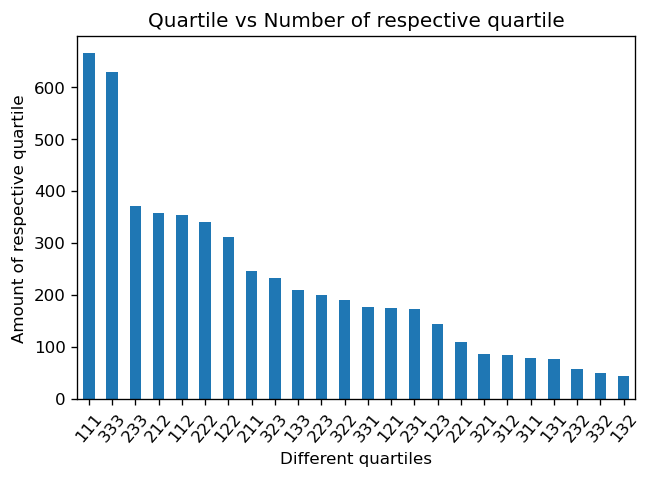

In [196]:
plt.figure(dpi=120)
dt['quartiles'].value_counts().plot(kind='bar')
plt.xticks(rotation=50)
plt.title('Quartile vs Number of respective quartile')
plt.xlabel('Different quartiles')
plt.ylabel('Amount of respective quartile')
dt['quartiles'].value_counts()

## Percentage wise quartile cuts

([<matplotlib.patches.Wedge at 0x18757f73070>,
 [Text(1.0173156494197348, 0.41841231990191585, '111'),
  Text(0.4492991979628214, 1.0040568861921946, '333'),
  Text(-0.18209429710529212, 1.0848233344474711, '233'),
  Text(-0.615755149294387, 0.9115073209346415, '212'),
  Text(-0.932647320017623, 0.5832400676084812, '112'),
  Text(-1.0873813793616605, 0.1661377013730867, '222'),
  Text(-1.0709426980872814, -0.251160780006621, '122'),
  Text(-0.9340157160156235, -0.5810461618802955, '211'),
  Text(-0.7368119670578742, -0.816766873226569, '323'),
  Text(-0.5028997300271895, -0.978310718298936, '133'),
  Text(-0.2561927627090742, -1.0697500962072835, '223'),
  Text(-0.0071105855182644565, -1.099977017747911, '322'),
  Text(0.22781753896417073, -1.0761501609628223, '331'),
  Text(0.44279942950929657, -1.006940249084444, '121'),
  Text(0.6375358913454259, -0.8964083819590228, '231'),
  Text(0.792081574449624, -0.7632868264403656, '123'),
  Text(0.8960335205535186, -0.638062638025819, '221'),

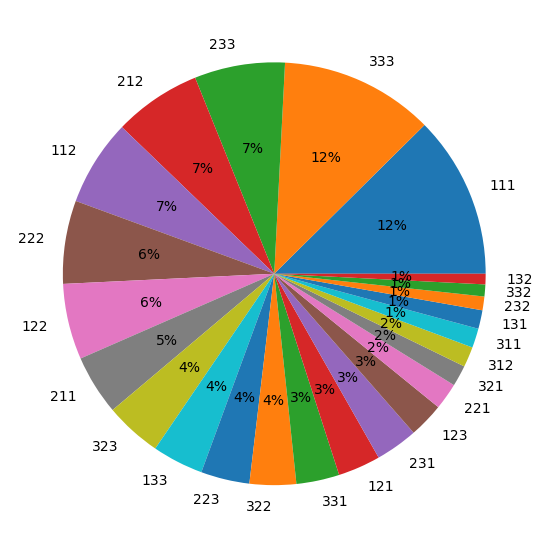

In [197]:
x=dt['quartiles'].value_counts().index
fig,ax = plt.subplots(figsize=(7,7),dpi=100)

ax.pie(dt['quartiles'].value_counts(),labels=x,autopct='%1.0f%%')

## Weak Customers data in terms of Sales-Quantity-Profit                                                               ( These customers should be given more offers and discounts so as to earn more profit )

In [198]:
dt[dt['quartiles']<='211']

Sales  \
Segment     City              Postal Code Region  Category        Sub-Category               
Consumer    Aberdeen          57401       Central Office Supplies Supplies         25.5000   
            Abilene           79605       Central Office Supplies Appliances        1.3920   
            Akron             44312       East    Furniture       Furnishings     149.2320   
                                                  Office Supplies Art              22.6080   
                                                                  Storage         221.0240   
                                                  Technology      Accessories      71.9760   
                                                                  Phones          323.9820   
            Albuquerque       87105       West    Office Supplies Paper             4.2800   
                                                  Technology      Phones           23.9760   
            Allen             75002       Central Furniture       Tables          244.0060   
                                                  Office Supplies Binders           8.7840   
                                                  Technology      Accessories      21.4800   
            Allentown         18103       East    Furniture       Furnishings      11.6480   
                                                  Office Supplies Art               4.1600   
            Amarillo          79109       Central Furniture       Furnishings      23.0760   
            Anaheim           92804       West    Office Supplies Appliances       83.4200   
                                                                  Paper            30.9800   
                                                  Technology      Phones          302.3760   
            Andover           1810        East    Office Supplies Paper            17.9400   
                                                                  Storage          11.2100   
            Apopka            32712       South   Office Supplies Fasteners        14.3200   
            Apple Valley      55124       Central Office Supplies Art               8.6400   
                                                                  Storage         129.3000   
            Arlington         22204       South   Furniture       Bookcases       359.9700   
                                                                  Chairs          641.9600   
                                                  Office Supplies Appliances       36.2700   
                              76017       Central Office Supplies Art               8.9280   
                                                                  Binders           2.7240   
            Arlington Heights 60004       Central Office Supplies Art              14.1120   
            Asheville         28806       South   Office Supplies Appliances       43.5840   
            Athens            30605       South   Furniture       Furnishings     186.5400   
                                                  Office Supplies Labels           14.7300   
                                                                  Paper            15.8400   
            Atlanta           30318       South   Furniture       Chairs           67.8800   
            Auburn            13021       East    Office Supplies Binders          15.5280   
                                                                  Envelopes        27.1800   
                                                                  Labels           20.7000   
                              36830       South   Furniture       Chairs          350.9800   
                                                  Office Supplies Envelopes         7.3800   
                                                                  Paper            13.0800   
            Aurora            60505       Central Furniture       Furnishings      77.7200   
                                           

## Strong customers ,who transactions rapidly and provide large Sales value with appreciable profits.  (Regular best customers)

In [199]:
dt[dt['quartiles']>='332']


Sales  \
Segment     City             Postal Code Region  Category        Sub-Category               
Consumer    Anaheim          92804       West    Office Supplies Binders         545.1680   
                                                                 Storage        1049.0400   
            Arlington        22204       South   Technology      Phones         2513.7900   
            Atlanta          30318       South   Furniture       Bookcases      1628.8200   
                                                 Office Supplies Binders        6381.9100   
                                                                 Paper           937.6700   
                                                                 Storage        1396.8600   
                                                 Technology      Accessories     819.6900   
            Auburn           13021       East    Office Supplies Art             372.9800   
            Aurora           80013       West    Technology      Phones          426.7120   
            Austin           78745       Central Office Supplies Paper           585.0000   
                                                 Technology      Accessories     283.8800   
            Avondale         85323       West    Technology      Phones          742.3360   
            Baltimore        21215       East    Furniture       Chairs          908.8200   
                                                 Office Supplies Paper           415.9100   
            Bellingham       98226       West    Furniture       Tables         2665.6200   
            Boynton Beach    33437       South   Furniture       Furnishings     276.9680   
            Carol Stream     60188       Central Office Supplies Storage         504.1040   
            Carrollton       75007       Central Technology      Accessories    1575.8320   
            Charlotte        28205       South   Office Supplies Appliances      309.4560   
                                                                 Paper           460.4000   
                                                 Technology      Accessories    1541.4240   
                                                                 Phones          927.1200   
            Chesapeake       23320       South   Furniture       Tables         2909.1600   
                                                 Office Supplies Appliances      401.6400   
            Chicago          60610       Central Technology      Accessories     317.0800   
                                                                 Phones         5058.7520   
                             60623       Central Office Supplies Storage        3075.2400   
                                                 Technology      Accessories     450.4720   
                                                                 Phones         2463.8880   
                             60653       Central Office Supplies Paper           522.2080   
                                                 Technology      Phones          518.9760   
            Clinton          20735       East    Office Supplies Binders         281.1300   
            Columbia         21044       East    Furniture       Furnishings    1135.7200   
                             29203       South   Office Supplies Storage        1392.6600   
                                                 Technology      Phones          743.6800   
                             38401       South   Furniture       Chairs         1214.1440   
                                                 Office Supplies Appliances      915.3120   
            Columbus         31907       South   Furniture       Furnishings     433.1800   
                                                 Office Supplies Storage         833.6000   
                                                 Technology      Accessories     499.9000   
                                                                 Phones         3227.

# Conclusions

## 1 : Most of the supplies of products are from Home Supplies category.
## 2 : Most of the supplies of products are from Binders sub-category.
## 3 : Most of the buys are from Customer segment
## 4 : Most of the Sales and Profit income is acheived by West region of the country.
## 5 : Total Sales income in USA  2297200.8603 USD dollars
## 6 : Total Profit income in USA  286397.0217 USD dollars
## 7 : Florida has most of the sales value among all states.
## 8 : Indiana has most of the profit value among all states.
## 9 : Topmost customers constitute 12% of the whole dataset acheiving 333 quartile value.
## 10 : All weak regions are included in the weak customers cell where we can provide more offers and discount so that we can earn more profit there as well.
## 11 : Also strong regions are also reflected in the last cell where we can regularly contact with them and make them happy with the services.